# Airbnbs NYC
### Python Exploratory Data Analysis by Emily In

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn import datasets 
import plotly
from plotly.graph_objs import Scatter
from plotly.graph_objs import Figure, Histogram, Layout
from plotly.graph_objs import Bar



In [2]:
df = pd.read_csv('~/Downloads/airbnb_nyc_clean.csv') 

In [3]:
df

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,...,966.00000,193.000000,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,...,142.00000,28.000000,13.0,45.0,2022-05-21,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.80902,-73.94190,True,...,620.00000,124.000000,3.0,0.0,2019-06-14,0.79,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and..."
3,1002755,blank,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,True,...,368.00000,74.000000,13.0,270.0,2019-07-05,4.64,4.0,1.0,322.0,blank
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,False,...,204.00000,41.000000,10.0,9.0,2018-11-19,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69300,57361342,Sunny budget friendly room in Bushwick,29964876857,verified,blank,Brooklyn,Bushwick,40.69370,-73.91006,True,...,624.73607,124.894026,5.0,3.0,2018-04-09,0.11,1.0,1.0,0.0,Please be mindful that I live in the same buil...
69301,57361894,"Cozy Apartment on Bedford Ave, Brooklyn",92852058426,unconfirmed,blank,Brooklyn,Williamsburg,40.71284,-73.96284,False,...,624.73607,124.894026,7.0,15.0,2018-01-01,0.55,4.0,1.0,0.0,blank
69302,57362446,Your 1 bedroom home away from home!,95572379802,verified,blank,Manhattan,Upper West Side,40.79563,-73.97634,True,...,624.73607,124.894026,3.0,38.0,2019-06-10,1.40,3.0,1.0,31.0,blank
69303,57362999,MASTER Cozy Bedroom Queen size 2 blocks Timesq...,80154173698,verified,blank,Manhattan,Hell's Kitchen,40.76125,-73.98945,True,...,624.73607,124.894026,1.0,81.0,2019-03-05,2.96,2.0,2.0,0.0,- I work at home and prefer to rent to folks w...


In [4]:
# first I am examining all the columns that exist
df.columns.tolist()

['id',
 'name',
 'host_id',
 'host_identity_verified',
 'host_name',
 'neighbourhood_group',
 'neighbourhood',
 'lat',
 'long',
 'instant_bookable',
 'cancellation_policy',
 'room_type',
 'construction_year',
 'price',
 'service_fee',
 'minimum_nights',
 'number_of_reviews',
 'last_review',
 'reviews_per_month',
 'review_rate_number',
 'calculated_host_listings_count',
 'availability_365',
 'house_rules']

In [5]:
# We have 69305 rows and 23 columns
df.shape

(69305, 23)

## Additional brief data clean

In [6]:
df = df.astype({"number_of_reviews":"int","construction_year":"int","calculated_host_listings_count":"int","minimum_nights":"int"})
df = df.round(2)
df

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,False,...,966.00,193.00,10,9,2021-10-19,0.21,4.0,6,286.0,Clean up and treat the home the way you'd like...
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,False,...,142.00,28.00,13,45,2022-05-21,0.38,4.0,2,228.0,Pet friendly but please confirm with me if the...
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.81,-73.94,True,...,620.00,124.00,3,0,2019-06-14,0.79,5.0,1,352.0,"I encourage you to use my kitchen, cooking and..."
3,1002755,blank,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,True,...,368.00,74.00,13,270,2019-07-05,4.64,4.0,1,322.0,blank
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,False,...,204.00,41.00,10,9,2018-11-19,0.10,3.0,1,289.0,"Please no smoking in the house, porch or on th..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69300,57361342,Sunny budget friendly room in Bushwick,29964876857,verified,blank,Brooklyn,Bushwick,40.69,-73.91,True,...,624.74,124.89,5,3,2018-04-09,0.11,1.0,1,0.0,Please be mindful that I live in the same buil...
69301,57361894,"Cozy Apartment on Bedford Ave, Brooklyn",92852058426,unconfirmed,blank,Brooklyn,Williamsburg,40.71,-73.96,False,...,624.74,124.89,7,15,2018-01-01,0.55,4.0,1,0.0,blank
69302,57362446,Your 1 bedroom home away from home!,95572379802,verified,blank,Manhattan,Upper West Side,40.80,-73.98,True,...,624.74,124.89,3,38,2019-06-10,1.40,3.0,1,31.0,blank
69303,57362999,MASTER Cozy Bedroom Queen size 2 blocks Timesq...,80154173698,verified,blank,Manhattan,Hell's Kitchen,40.76,-73.99,True,...,624.74,124.89,1,81,2019-03-05,2.96,2.0,2,0.0,- I work at home and prefer to rent to folks w...


In [7]:
# Round 'price' column to 2 decimal places
df['price'] = round(df['price'], 2)
df

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,False,...,966.00,193.00,10,9,2021-10-19,0.21,4.0,6,286.0,Clean up and treat the home the way you'd like...
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,False,...,142.00,28.00,13,45,2022-05-21,0.38,4.0,2,228.0,Pet friendly but please confirm with me if the...
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.81,-73.94,True,...,620.00,124.00,3,0,2019-06-14,0.79,5.0,1,352.0,"I encourage you to use my kitchen, cooking and..."
3,1002755,blank,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,True,...,368.00,74.00,13,270,2019-07-05,4.64,4.0,1,322.0,blank
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,False,...,204.00,41.00,10,9,2018-11-19,0.10,3.0,1,289.0,"Please no smoking in the house, porch or on th..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69300,57361342,Sunny budget friendly room in Bushwick,29964876857,verified,blank,Brooklyn,Bushwick,40.69,-73.91,True,...,624.74,124.89,5,3,2018-04-09,0.11,1.0,1,0.0,Please be mindful that I live in the same buil...
69301,57361894,"Cozy Apartment on Bedford Ave, Brooklyn",92852058426,unconfirmed,blank,Brooklyn,Williamsburg,40.71,-73.96,False,...,624.74,124.89,7,15,2018-01-01,0.55,4.0,1,0.0,blank
69302,57362446,Your 1 bedroom home away from home!,95572379802,verified,blank,Manhattan,Upper West Side,40.80,-73.98,True,...,624.74,124.89,3,38,2019-06-10,1.40,3.0,1,31.0,blank
69303,57362999,MASTER Cozy Bedroom Queen size 2 blocks Timesq...,80154173698,verified,blank,Manhattan,Hell's Kitchen,40.76,-73.99,True,...,624.74,124.89,1,81,2019-03-05,2.96,2.0,2,0.0,- I work at home and prefer to rent to folks w...


In [8]:
# # Round 'service_fee' column to 2 decimal places
df['service_fee'] = round(df['service_fee'], 2)
df

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,False,...,966.00,193.00,10,9,2021-10-19,0.21,4.0,6,286.0,Clean up and treat the home the way you'd like...
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,False,...,142.00,28.00,13,45,2022-05-21,0.38,4.0,2,228.0,Pet friendly but please confirm with me if the...
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.81,-73.94,True,...,620.00,124.00,3,0,2019-06-14,0.79,5.0,1,352.0,"I encourage you to use my kitchen, cooking and..."
3,1002755,blank,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,True,...,368.00,74.00,13,270,2019-07-05,4.64,4.0,1,322.0,blank
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,False,...,204.00,41.00,10,9,2018-11-19,0.10,3.0,1,289.0,"Please no smoking in the house, porch or on th..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69300,57361342,Sunny budget friendly room in Bushwick,29964876857,verified,blank,Brooklyn,Bushwick,40.69,-73.91,True,...,624.74,124.89,5,3,2018-04-09,0.11,1.0,1,0.0,Please be mindful that I live in the same buil...
69301,57361894,"Cozy Apartment on Bedford Ave, Brooklyn",92852058426,unconfirmed,blank,Brooklyn,Williamsburg,40.71,-73.96,False,...,624.74,124.89,7,15,2018-01-01,0.55,4.0,1,0.0,blank
69302,57362446,Your 1 bedroom home away from home!,95572379802,verified,blank,Manhattan,Upper West Side,40.80,-73.98,True,...,624.74,124.89,3,38,2019-06-10,1.40,3.0,1,31.0,blank
69303,57362999,MASTER Cozy Bedroom Queen size 2 blocks Timesq...,80154173698,verified,blank,Manhattan,Hell's Kitchen,40.76,-73.99,True,...,624.74,124.89,1,81,2019-03-05,2.96,2.0,2,0.0,- I work at home and prefer to rent to folks w...


## Renaming some misspelled columns

In [9]:
df = df.rename(columns={'neighbourhood_group': 'borough', 'neighbourhood': 'neighborhood'})
df

,id,name,host_id,host_identity_verified,host_name,borough,neighborhood,lat,long,instant_bookable,...,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,False,...,966.00,193.00,10,9,2021-10-19,0.21,4.0,6,286.0,Clean up and treat the home the way you'd like...
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,False,...,142.00,28.00,13,45,2022-05-21,0.38,4.0,2,228.0,Pet friendly but please confirm with me if the...
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.81,-73.94,True,...,620.00,124.00,3,0,2019-06-14,0.79,5.0,1,352.0,"I encourage you to use my kitchen, cooking and..."
3,1002755,blank,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,True,...,368.00,74.00,13,270,2019-07-05,4.64,4.0,1,322.0,blank
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,False,...,204.00,41.00,10,9,2018-11-19,0.10,3.0,1,289.0,"Please no smoking in the house, porch or on th..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69300,57361342,Sunny budget friendly room in Bushwick,29964876857,verified,blank,Brooklyn,Bushwick,40.69,-73.91,True,...,624.74,124.89,5,3,2018-04-09,0.11,1.0,1,0.0,Please be mindful that I live in the same buil...
69301,57361894,"Cozy Apartment on Bedford Ave, Brooklyn",92852058426,unconfirmed,blank,Brooklyn,Williamsburg,40.71,-73.96,False,...,624.74,124.89,7,15,2018-01-01,0.55,4.0,1,0.0,blank
69302,57362446,Your 1 bedroom home away from home!,95572379802,verified,blank,Manhattan,Upper West Side,40.80,-73.98,True,...,624.74,124.89,3,38,2019-06-10,1.40,3.0,1,31.0,blank
69303,57362999,MASTER Cozy Bedroom Queen size 2 blocks Timesq...,80154173698,verified,blank,Manhattan,Hell's Kitchen,40.76,-73.99,True,...,624.74,124.89,1,81,2019-03-05,2.96,2.0,2,0.0,- I work at home and prefer to rent to folks w...


## Which areas are listings mostly aggregated in?

In [10]:
df['borough'].value_counts()

Manhattan        29587
Brooklyn         27895
Queens            9262
Bronx             1912
Staten Island      649
Name: borough, dtype: int64

## Let's create a subset of the dataset that only contains ratings 5 and 4 
#### 5 is Great, 4 is Good

In [12]:
rating = [5.0, 4.0] 

In [13]:
df[df.review_rate_number.isin(rating)].review_rate_number.value_counts() 

5.0    16101
4.0    16066
Name: review_rate_number, dtype: int64

In [14]:
# here I want to subset a separate dataframe called highrated to get only the listings(rows) with 5 or 4 rating.

highrated = df[df['review_rate_number'].isin(rating)]
highrated.shape

(32167, 23)

## Boroughs with a rating 5 or 4

In [15]:

topr_borough = highrated['borough'].value_counts()
topr_borough

Manhattan        13671
Brooklyn         12881
Queens            4395
Bronx              907
Staten Island      313
Name: borough, dtype: int64

## Room types with a rating 5 or 4

In [16]:
topr_room = highrated['room_type'].value_counts()
topr_room 

Entire home/apt    17244
Private room       14183
Shared room          683
Hotel room            57
Name: room_type, dtype: int64

## Pie charts to visualize the above

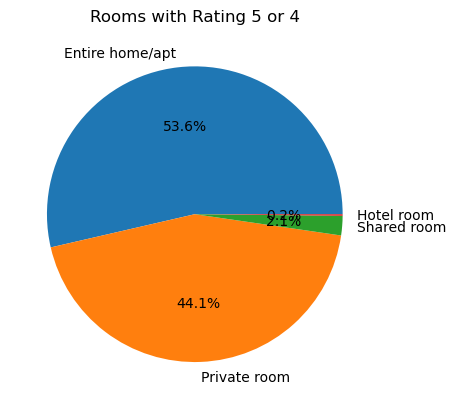

In [17]:
plt.pie(topr_room, labels=topr_room.index, autopct='%1.1f%%')
plt.title('Rooms with Rating 5 or 4')
plt.show()

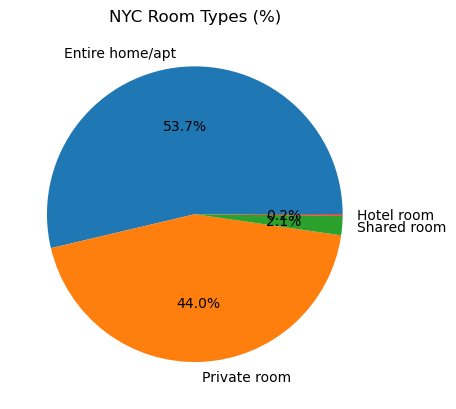

In [18]:
# From these values I'd like to create a piechart to visually represent the total percentage of each type of room
# available in NYC.

room_types = df['room_type'].value_counts()
plt.pie(room_types, labels=room_types.index, autopct='%1.1f%%')
plt.title('NYC Room Types (%)')
plt.show()

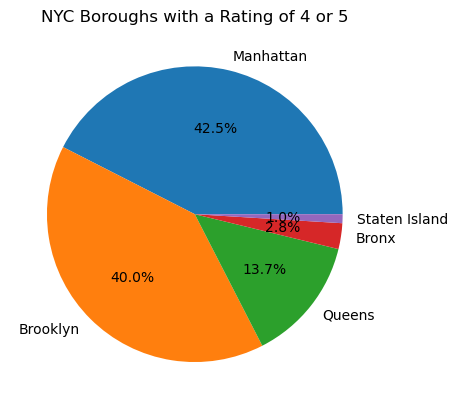

In [19]:
topr_borough = highrated['borough'].value_counts()
plt.pie(topr_borough, labels=topr_borough.index, autopct='%1.1f%%')
plt.title('NYC Boroughs with a Rating of 4 or 5')
plt.show()

## Top 100 reviewed listings (by count of 'Number of Reviews')
##### This df will be used later for word frequency count in determining which are the common keywords of the most reviewed listings


In [73]:
top100_df = df.sort_values('number_of_reviews', ascending=False).head(100)
top100_df



,id,name,host_id,host_identity_verified,host_name,borough,neighborhood,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
52488,29990458,Sonder Battery Park | Studio Apartment,53558555483,verified,Sonder (NYC),Manhattan,Financial District,40.71,-74.01,False,strict,Entire home/apt,2019,121.0,24.0,2,1024,2022-02-21,57.31,4.0,54,365.0,No
62244,35378697,City King,44069230937,verified,Arlo SoHo,Manhattan,SoHo,40.72,-74.01,False,moderate,Hotel room,2017,1097.0,219.0,1,1010,2021-11-22,33.08,4.0,11,80.0,No
49799,28505324,Amazing Micro Unit W/ communal rooftop and kit...,23813117370,verified,The Ridge,Manhattan,East Village,40.72,-73.99,True,strict,Private room,2011,123.0,25.0,1,966,2022-03-02,34.46,2.0,4,355.0,No
53078,30316315,Enjoy great views of the City!,41031720514,unconfirmed,Row NYC,Manhattan,Theater District,40.76,-73.99,False,flexible,Hotel room,2004,486.0,97.0,1,884,2022-02-19,25.23,3.0,9,360.0,No
49653,28424688,Come catch a Broadway Show & stay in Times Square,20032806094,verified,M,Manhattan,Theater District,40.76,-73.98,False,flexible,Private room,2008,89.0,18.0,1,849,2022-03-03,90.00,4.0,12,361.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14700,9120146,Walking distance to LaGuardia airport,53419750135,unconfirmed,Maya,Queens,East Elmhurst,40.77,-73.88,True,flexible,Private room,2006,854.0,171.0,1,412,2019-07-01,10.19,1.0,5,64.0,Yes
18046,10968142,Space to rest near LaGuardia Airport,51307969058,unconfirmed,Maya,Queens,East Elmhurst,40.77,-73.88,False,strict,Private room,2015,489.0,98.0,1,411,2019-07-04,11.40,4.0,5,161.0,Yes
53406,30497470,bedroom+private bath+often whole apt Central Park,24620519911,unconfirmed,Arlette,Manhattan,Upper West Side,40.80,-73.96,False,moderate,Private room,2010,757.0,151.0,3,408,2022-02-17,3.56,3.0,1,122.0,No
9977,6511633,JFK 10 & LGA 15 MINUTES AWAY A/C PRIVATE BED...,25594314671,verified,Gurpreet Singh,Queens,Richmond Hill,40.69,-73.83,False,flexible,Private room,2011,74.0,15.0,1,408,2018-11-24,8.56,5.0,5,85.0,Yes


### Let's get a better measure of what makes a listing popular

In [21]:
# filtering out a dataframe that contains only the listings that were available 365 days or more
# Result was 1,746 listings 
# Merging with 'highrated' df so i have a dataframe with just listings with a rating of 5 or 4 that were ALSO 
# available for 365 days or more
# and then I want to see what types of rooms they were and what neighborhoods they were in


year_round = df[df.availability_365 >= 365]
highrated_agg = highrated.groupby('review_rate_number').mean()
highrated_365 = pd.merge(year_round, highrated_agg, how='inner', on='review_rate_number')


''' Docstring:

This merges the year_round dataframe with the highrated_agg dataframe on the review_rate_number column 
using the inner merge method, so that ONLY the rows matching review_rate_number values in both dataframes will 
be included in the new merged df. 


'''


highrated_365

,id_x,name,host_id_x,host_identity_verified,host_name,borough,neighborhood,lat_x,long_x,instant_bookable_x,cancellation_policy,room_type,construction_year_x,price_x,service_fee_x,minimum_nights_x,number_of_reviews_x,last_review,reviews_per_month_x,review_rate_number,calculated_host_listings_count_x,availability_365_x,house_rules,id_y,host_id_y,lat_y,long_y,instant_bookable_y,construction_year_y,price_y,service_fee_y,minimum_nights_y,number_of_reviews_y,reviews_per_month_y,calculated_host_listings_count_y,availability_365_y
0,1006307,Cozy Clean Guest Room - Family Apt,75527839483,unconfirmed,Carl,Manhattan,Upper West Side,40.80,-73.97,False,strict,Private room,2015,291.0,58.0,2,118,2017-07-21,0.99,5.0,1,375.0,NO SMOKING OR PETS ANYWHERE ON THE PROPERTY 1....,2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
1,1064851,2 BR / 2 Bath Duplex Apt with patio! East Village,63842204720,unconfirmed,Olivia,Manhattan,East Village,40.73,-73.98,False,flexible,Entire home/apt,2008,677.0,135.0,2,7,2017-08-09,0.06,5.0,1,417.0,No smoking or drugs anywhere on property; no p...,2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
2,1086943,Private Bdrm/Bathrm. New! Elevator!,80380133240,unconfirmed,Audrey,Manhattan,East Harlem,40.79,-73.94,True,moderate,Private room,2022,370.0,74.0,2,34,2019-06-14,0.32,5.0,1,373.0,"No smoking, No animals—we already have enough!...",2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
3,1090256,Indie-Chic Share In Williamsburg,1595619477,unconfirmed,Darcy,Brooklyn,Williamsburg,40.71,-73.95,True,moderate,Private room,2022,1020.0,204.0,4,202,2019-05-28,1.86,5.0,2,377.0,"No smoking in the apartment, even with the win...",2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
4,1123947,"Great new apt, close to everything",79638424542,verified,Ross,Manhattan,Hell's Kitchen,40.77,-73.99,False,flexible,Entire home/apt,2020,813.0,163.0,3,94,2019-06-09,0.96,5.0,1,395.0,Kid friendly if you bring your own pack n play...,2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1741,38841618,IN MINT CONDITION-1BR&TERRACE-E 44TH/UNITED NA...,52745988233,unconfirmed,Rated,Manhattan,Midtown,40.75,-73.97,False,strict,Entire home/apt,2007,613.0,123.0,13,0,2019-06-14,0.79,4.0,33,365.0,blank,2.125788e+07,4.948301e+10,40.728023,-73.948206,0.489917,2012.555894,626.004982,125.081343,4.691647,27.376260,1.342907,9.657040,151.033923
1742,38859844,Manhattan nyc private room D\n 15 MinTimes Square,28409974556,unconfirmed,Eliahu,Manhattan,Harlem,40.81,-73.95,True,flexible,Private room,2017,533.0,107.0,2,2,2018-10-22,0.10,4.0,9,365.0,blank,2.125788e+07,4.948301e+10,40.728023,-73.948206,0.489917,2012.555894,626.004982,125.081343,4.691647,27.376260,1.342907,9.657040,151.033923
1743,38901267,Room o4,79308106611,unconfirmed,Justine,Bronx,University Heights,40.86,-73.91,True,flexible,Private room,2011,919.0,184.0,3,12,2019-05-26,0.54,4.0,5,365.0,blank,2.125788e+07,4.948301e+10,40.728023,-73.948206,0.489917,2012.555894,626.004982,125.081343,4.691647,27.376260,1.342907,9.657040,151.033923
1744,38928329,Perfect one bedroom in midtown Manhattan,68308802445,unconfirmed,Stanley,Manhattan,Murray Hill,40.75,-73.98,False,strict,Entire home/apt,2019,1170.0,234.0,13,1,2018-08-11,0.09,4.0,50,365.0,blank,2.125788e+07,4.948301e+10,40.728023,-73.948206,0.489917,2012.555894,626.004982,125.081343,4.691647,27.376260,1.342907,9.657040,151.033923


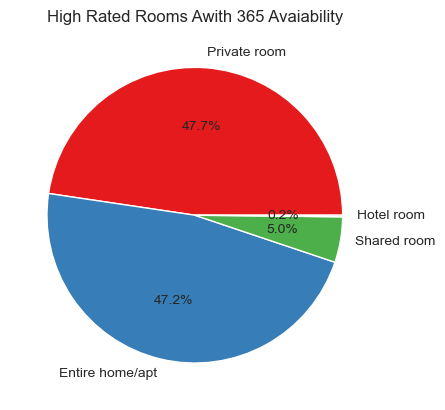

In [77]:
toptypes_365 = highrated_365.room_type.value_counts()

plt.pie(toptypes_365, labels=top10_r.index, autopct='%1.1f%%')
plt.title('High Rated Rooms Awith 365 Avaiability')
plt.show()

### Among the high rated listings available year-round, which were the top 10 neighborhoods?

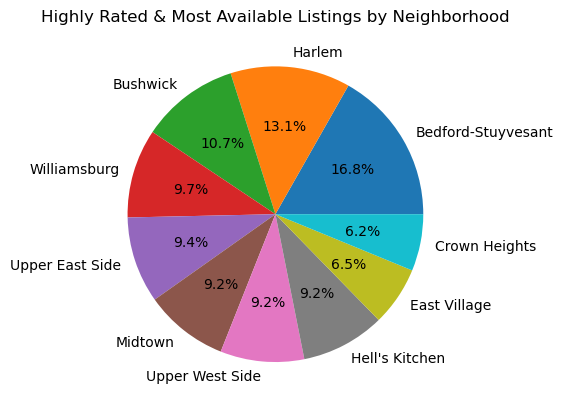

In [23]:


highrated_n = highrated_365.neighborhood.value_counts().sort_values(ascending=False)[0:10]

plt.pie(highrated_n, labels=highrated_n.index, autopct='%1.1f%%') # to show percentage value of each slice
plt.title('Highly Rated & Most Available Listings by Neighborhood')
plt.show()

In [24]:
highrated_365

,id_x,name,host_id_x,host_identity_verified,host_name,borough,neighborhood,lat_x,long_x,instant_bookable_x,cancellation_policy,room_type,construction_year_x,price_x,service_fee_x,minimum_nights_x,number_of_reviews_x,last_review,reviews_per_month_x,review_rate_number,calculated_host_listings_count_x,availability_365_x,house_rules,id_y,host_id_y,lat_y,long_y,instant_bookable_y,construction_year_y,price_y,service_fee_y,minimum_nights_y,number_of_reviews_y,reviews_per_month_y,calculated_host_listings_count_y,availability_365_y
0,1006307,Cozy Clean Guest Room - Family Apt,75527839483,unconfirmed,Carl,Manhattan,Upper West Side,40.80,-73.97,False,strict,Private room,2015,291.0,58.0,2,118,2017-07-21,0.99,5.0,1,375.0,NO SMOKING OR PETS ANYWHERE ON THE PROPERTY 1....,2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
1,1064851,2 BR / 2 Bath Duplex Apt with patio! East Village,63842204720,unconfirmed,Olivia,Manhattan,East Village,40.73,-73.98,False,flexible,Entire home/apt,2008,677.0,135.0,2,7,2017-08-09,0.06,5.0,1,417.0,No smoking or drugs anywhere on property; no p...,2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
2,1086943,Private Bdrm/Bathrm. New! Elevator!,80380133240,unconfirmed,Audrey,Manhattan,East Harlem,40.79,-73.94,True,moderate,Private room,2022,370.0,74.0,2,34,2019-06-14,0.32,5.0,1,373.0,"No smoking, No animals—we already have enough!...",2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
3,1090256,Indie-Chic Share In Williamsburg,1595619477,unconfirmed,Darcy,Brooklyn,Williamsburg,40.71,-73.95,True,moderate,Private room,2022,1020.0,204.0,4,202,2019-05-28,1.86,5.0,2,377.0,"No smoking in the apartment, even with the win...",2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
4,1123947,"Great new apt, close to everything",79638424542,verified,Ross,Manhattan,Hell's Kitchen,40.77,-73.99,False,flexible,Entire home/apt,2020,813.0,163.0,3,94,2019-06-09,0.96,5.0,1,395.0,Kid friendly if you bring your own pack n play...,2.104912e+07,4.933915e+10,40.727708,-73.948732,0.503012,2012.534563,622.828591,124.563951,4.670455,27.822309,1.333116,9.396187,153.479908
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1741,38841618,IN MINT CONDITION-1BR&TERRACE-E 44TH/UNITED NA...,52745988233,unconfirmed,Rated,Manhattan,Midtown,40.75,-73.97,False,strict,Entire home/apt,2007,613.0,123.0,13,0,2019-06-14,0.79,4.0,33,365.0,blank,2.125788e+07,4.948301e+10,40.728023,-73.948206,0.489917,2012.555894,626.004982,125.081343,4.691647,27.376260,1.342907,9.657040,151.033923
1742,38859844,Manhattan nyc private room D\n 15 MinTimes Square,28409974556,unconfirmed,Eliahu,Manhattan,Harlem,40.81,-73.95,True,flexible,Private room,2017,533.0,107.0,2,2,2018-10-22,0.10,4.0,9,365.0,blank,2.125788e+07,4.948301e+10,40.728023,-73.948206,0.489917,2012.555894,626.004982,125.081343,4.691647,27.376260,1.342907,9.657040,151.033923
1743,38901267,Room o4,79308106611,unconfirmed,Justine,Bronx,University Heights,40.86,-73.91,True,flexible,Private room,2011,919.0,184.0,3,12,2019-05-26,0.54,4.0,5,365.0,blank,2.125788e+07,4.948301e+10,40.728023,-73.948206,0.489917,2012.555894,626.004982,125.081343,4.691647,27.376260,1.342907,9.657040,151.033923
1744,38928329,Perfect one bedroom in midtown Manhattan,68308802445,unconfirmed,Stanley,Manhattan,Murray Hill,40.75,-73.98,False,strict,Entire home/apt,2019,1170.0,234.0,13,1,2018-08-11,0.09,4.0,50,365.0,blank,2.125788e+07,4.948301e+10,40.728023,-73.948206,0.489917,2012.555894,626.004982,125.081343,4.691647,27.376260,1.342907,9.657040,151.033923


### Separate Listings df - last review was within the last year (2022) 


In [27]:
# filter DataFrame to select values from 2020-2022
recent_df = df[(df["last_review"] >= "2022-01-01") & (df["last_review"] <= "2022-12-31")]

recent_df

,id,name,host_id,host_identity_verified,host_name,borough,neighborhood,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,False,moderate,Entire home/apt,2007,142.0,28.0,13,45,2022-05-21,0.38,4.0,2,228.0,Pet friendly but please confirm with me if the...
103,1058223,Monkey Retreat Manhattan,62028601494,verified,Kelsey,Manhattan,Washington Heights,40.84,-73.94,True,strict,Private room,2007,306.0,61.0,3,68,2022-01-02,0.60,3.0,1,393.0,Not many rules except there is no smoking
189,1105721,"LARGE, COMFY 1BDR W/CHARACTER!!!",5715989004,verified,Edgar,Brooklyn,Bedford-Stuyvesant,40.68,-73.94,False,flexible,Entire home/apt,2011,174.0,35.0,3,30,2022-03-02,0.29,3.0,1,127.0,blank
230,1128365,"Nice, clean, safe, convenient 3BR",41153188173,unconfirmed,Fowler,Queens,Ridgewood,40.70,-73.90,True,strict,Entire home/apt,2020,656.0,131.0,13,1,2022-04-03,0.01,5.0,5,80.0,-Remove shoes -be sure to lock the front door ...
316,1175863,Luxury 3 bed/ 2 bath apt in Harlem w/ terrace,44227072273,unconfirmed,Henderson,Manhattan,Harlem,40.80,-73.96,True,moderate,Entire home/apt,2007,725.0,145.0,13,31,2022-03-01,0.31,5.0,1,81.0,Please do not smoke in the house. If you smoke...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69186,39214421,Near to Manhattan,60684336625,unconfirmed,Ross,Queens,Elmhurst,40.75,-73.89,False,moderate,Entire home/apt,2022,1111.0,222.0,2,8,2022-01-08,0.19,4.0,1,62.0,blank
69187,39214973,EXTRA LARGE Room close to Midtown,90372253269,unconfirmed,Marlon,Manhattan,East Harlem,40.80,-73.94,False,moderate,Private room,2022,555.0,111.0,4,11,2022-01-08,0.86,3.0,11,0.0,blank
69188,39215525,Sunny & spacious 2BR APT - ideal for WFH in NY.,1673889518,verified,Alexander,Brooklyn,Crown Heights,40.67,-73.95,False,flexible,Entire home/apt,2016,236.0,47.0,3,15,2022-01-08,0.38,4.0,1,72.0,blank
69189,39216078,Minimalistic Manhattan 1BDR.Near Central Park ...,89390396171,verified,Kaz,Manhattan,East Harlem,40.80,-73.95,True,moderate,Entire home/apt,2011,613.0,123.0,13,14,2022-01-08,0.37,5.0,161,321.0,blank


## Total Number of Reviews in 2022 (Recent Data)

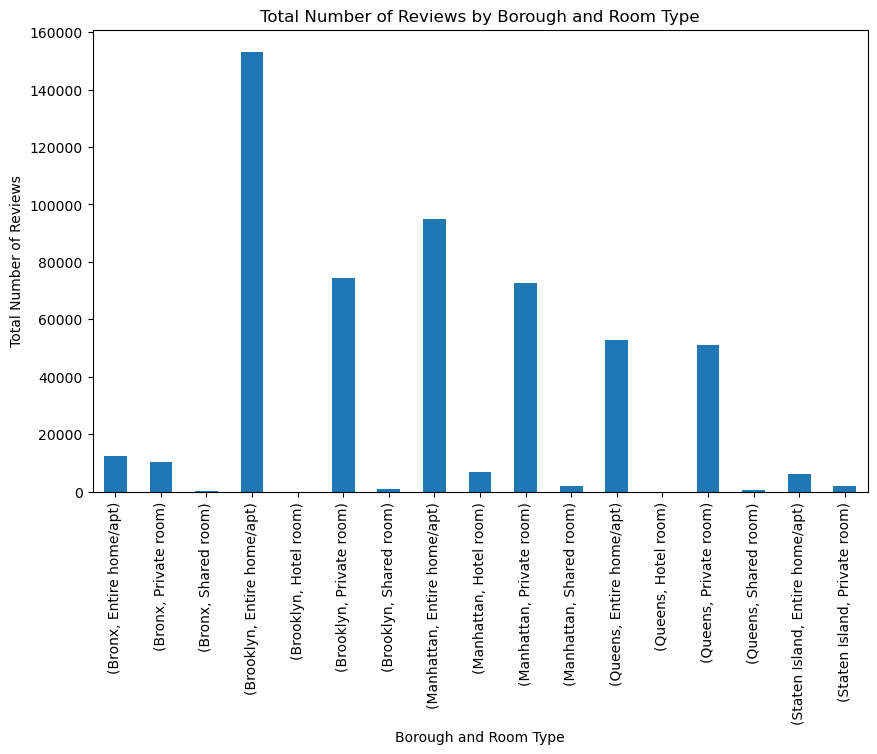

In [28]:
# total num reviews in 2022 for each borough and room type combination
top_listings22 = recent_df.groupby(['borough', 'room_type'])['number_of_reviews'].sum()


fig, ax = plt.subplots(figsize=(10, 6))
top_listings22.plot(kind='bar')
ax.set_xlabel('Borough and Room Type')
ax.set_ylabel('Total Number of Reviews')
ax.set_title('Total Number of Reviews by Borough and Room Type')
plt.show()

## Total Number of Reviews Historically (All the Data)

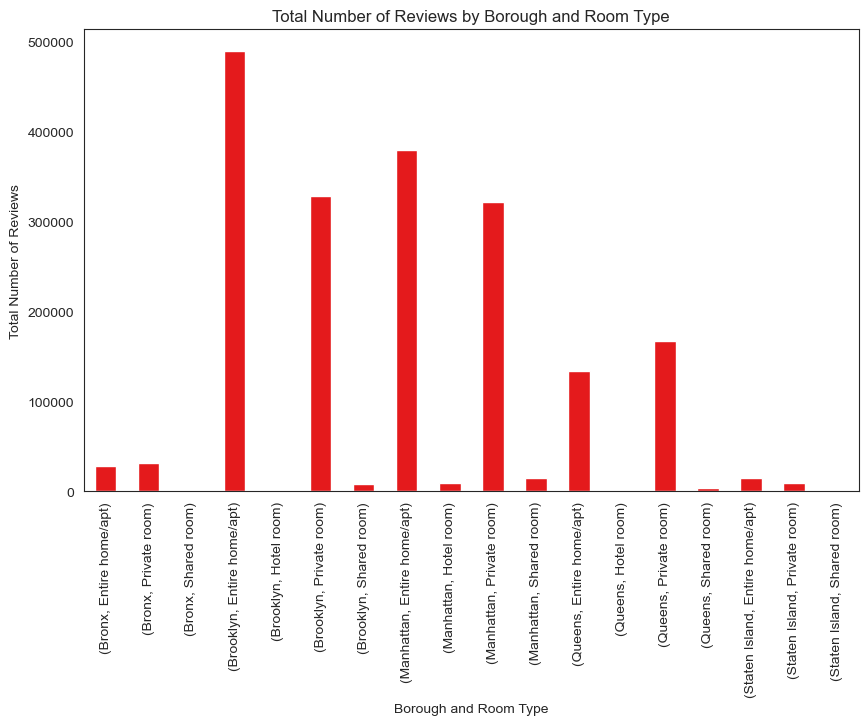

In [72]:
# reviews OVERALL for each borough and room type combination
top_listings = df.groupby(['borough', 'room_type'])['number_of_reviews'].sum()

fig, ax = plt.subplots(figsize=(10, 6))
top_listings.plot(kind='bar')
ax.set_xlabel('Borough and Room Type')
ax.set_ylabel('Total Number of Reviews')
ax.set_title('Total Number of Reviews by Borough and Room Type')
plt.show()

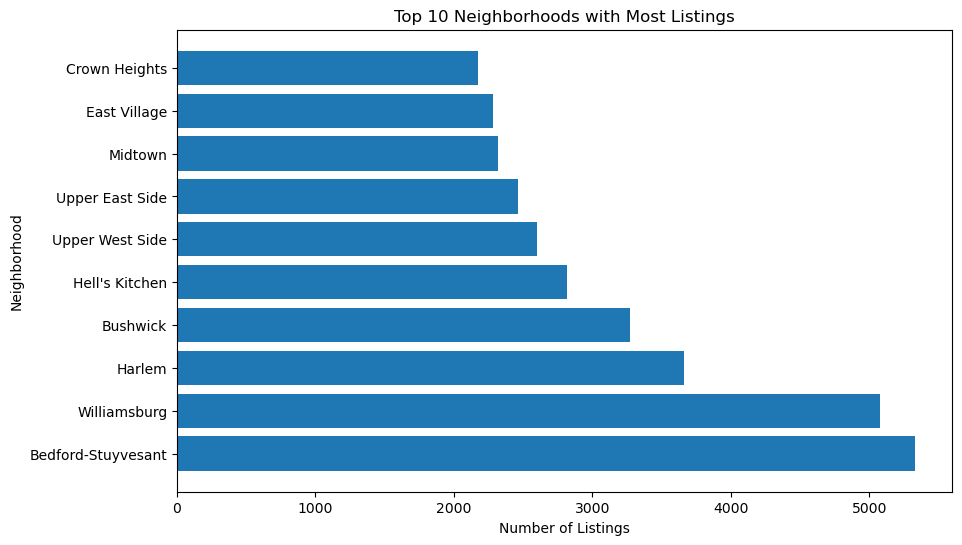

In [31]:

top10_n = df['neighborhood'].value_counts().head(10)

fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(top10_n.index, top10_n.values)
ax.set_xlabel('Number of Listings')
ax.set_ylabel('Neighborhood')
ax.set_title('Top 10 Neighborhoods with Most Listings')
plt.show()


### House Rules

In [32]:
# replacing any values in the 'house_rules' column that are not equal to "blank" with "Yes", and 
# values that are equal to "blank" with just "No" for easier filtering 

df.loc[df['house_rules'] != "blank", 'house_rules'] = "Yes"

In [33]:
df.loc[df['house_rules'] == "blank", 'house_rules'] = "No"

In [34]:
df['house_rules'].value_counts()

No     36645
Yes    32660
Name: house_rules, dtype: int64

In [35]:
yes_rules = df.loc[df.house_rules == 'Yes']['review_rate_number']
no_rules = df.loc[df.house_rules == 'No']['review_rate_number']


getbins = lambda t:{'start':t.min(),'end':t.max(), 'size':0.5} 
trace0 = Histogram(x = yes_rules,
                   name = 'Yes',
                   xbins = getbins(yes_rules))

trace1 = Histogram(x = no_rules,
                   name = 'No',
                   xbins = getbins(no_rules))

data = [trace0, trace1]

layout = Layout(title = "Histogram of House Rules Review Rating",
               bargroupgap = 0.1)
fig = Figure(data = data, layout = layout)

plotly.offline.iplot(fig, show_link = False, image_width = 600, image_height = 400)

## Avg price across boroughs did not differ much from each other

In [37]:
df.groupby('borough')['price'].mean()

borough
Bronx            629.491203
Brooklyn         626.276083
Manhattan        622.101029
Queens           627.898339
Staten Island    619.535008
Name: price, dtype: float64

In [38]:
# removing outliers of neighborhood values that only appear once in the data
# 5th avenue and 21st street only appeared once in data and was affecting data visualizations

counts = df['neighborhood'].value_counts()

df = df[~df['neighborhood'].isin(counts[counts == 1].index)]
df

,id,name,host_id,host_identity_verified,host_name,borough,neighborhood,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.65,-73.97,False,strict,Private room,2020,966.00,193.00,10,9,2021-10-19,0.21,4.0,6,286.0,Yes
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75,-73.98,False,moderate,Entire home/apt,2007,142.00,28.00,13,45,2022-05-21,0.38,4.0,2,228.0,Yes
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.81,-73.94,True,flexible,Private room,2005,620.00,124.00,3,0,2019-06-14,0.79,5.0,1,352.0,Yes
3,1002755,blank,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.69,-73.96,True,moderate,Entire home/apt,2005,368.00,74.00,13,270,2019-07-05,4.64,4.0,1,322.0,No
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.80,-73.94,False,moderate,Entire home/apt,2009,204.00,41.00,10,9,2018-11-19,0.10,3.0,1,289.0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69300,57361342,Sunny budget friendly room in Bushwick,29964876857,verified,blank,Brooklyn,Bushwick,40.69,-73.91,True,flexible,Private room,2016,624.74,124.89,5,3,2018-04-09,0.11,1.0,1,0.0,Yes
69301,57361894,"Cozy Apartment on Bedford Ave, Brooklyn",92852058426,unconfirmed,blank,Brooklyn,Williamsburg,40.71,-73.96,False,moderate,Private room,2005,624.74,124.89,7,15,2018-01-01,0.55,4.0,1,0.0,No
69302,57362446,Your 1 bedroom home away from home!,95572379802,verified,blank,Manhattan,Upper West Side,40.80,-73.98,True,flexible,Entire home/apt,2010,624.74,124.89,3,38,2019-06-10,1.40,3.0,1,31.0,No
69303,57362999,MASTER Cozy Bedroom Queen size 2 blocks Timesq...,80154173698,verified,blank,Manhattan,Hell's Kitchen,40.76,-73.99,True,strict,Entire home/apt,2020,624.74,124.89,1,81,2019-03-05,2.96,2.0,2,0.0,Yes


In [74]:


def find_keywords(dataframe, column):
    
    '''
     This function takes a dataframe and column as the arguments. It then splits the column values into 
     individual words and counts the frequency of each word using the value_counts().
    
    Param: dataframe, column
    Returns:
        list: of words that appear more than 10 times
        
    Excludes: filler words and symbol to be excluded from count   
    
    '''
    exclude = ['and','the', 'on','with', 'I', 'Sq.','&','.', 'a','A', 'w/', 'for', 'of', '-', '|', '+', '!!', ':', 'M', 'II', 'w.', 'J', '~']

    word_count = dataframe[column].str.split(expand=True).stack().value_counts() # split on whitespace and stack in 
    # single column and count frequency of words
    selected_words = word_count[~word_count.index.isin(exclude) & (word_count > 2)].index.tolist() # using ~ to use "is not in" instead
    
    return selected_words


find_keywords(top100_df, 'name') # applying function to top 100 most reviewed list 
#Using reviews as a measure of popularity or most frequently booked

['Room',
 'in',
 'Private',
 'JFK',
 'Manhattan',
 'East',
 'Home',
 'near',
 'Near',
 'LGA',
 'Park',
 'Apt',
 'from',
 'Village',
 'Queen',
 'Guest',
 'Bedroom',
 'City',
 'Brownstone',
 'airport',
 '5',
 'MINUTES',
 'Studio',
 'Apartment',
 'King',
 'Times',
 'LaGuardia',
 'NO',
 'PRIVATE',
 'Family',
 'Airport',
 'CLEANING',
 'FEE',
 'to',
 'Friendly',
 'Central',
 'room',
 'Penthouse',
 '2',
 'Slope',
 'away',
 'Quiet',
 'Historic',
 'Brooklyn',
 'Cozy',
 '10',
 'Square',
 'Subway',
 'Bathroom',
 'Modern',
 'Amazing',
 'Bright',
 'NYC']

## Is 365 days availability important in booking rate?

In [71]:
data = [Scatter(x = df['availability_365'], y = df['reviews_per_month'], mode = 'markers')]
layout = Layout(title = "Reviews Per Month vs. Year_Round Availability")
 
fig = Figure(data = data, layout = layout)

plotly.offline.iplot(fig, show_link = False)

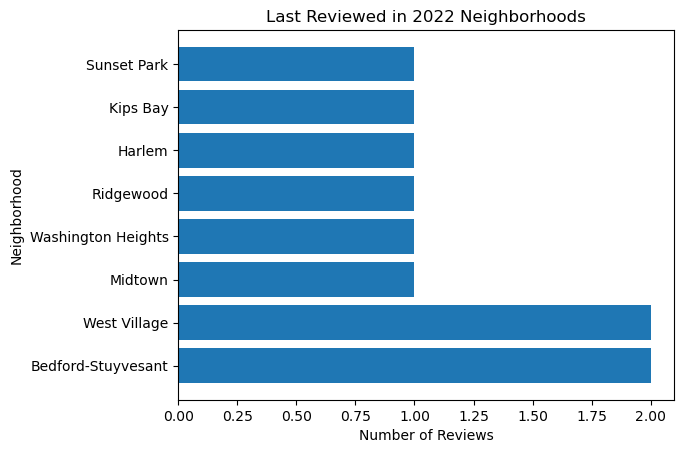

In [43]:
recent_ratings = recent_df['neighborhood'].head(10).value_counts()
plt.barh(recent_ratings.index, recent_ratings) #horizontal bar
plt.xlabel('Number of Reviews')
plt.ylabel('Neighborhood')
plt.title('Last Reviewed in 2022 Neighborhoods')
plt.show()


In [44]:
# I want to see which listings were available the whole year, are entire home apartments, and got a review in the 
# last year

# filtering based on specified criteria
spec_df = df[(df["availability_365"] >= 365) & 
                 (df["last_review"] >= "2022-01-01") & 
                 (df["last_review"] <= "2022-12-31")]
spec_df

,id,name,host_id,host_identity_verified,host_name,borough,neighborhood,lat,long,instant_bookable,cancellation_policy,room_type,construction_year,price,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules
103,1058223,Monkey Retreat Manhattan,62028601494,verified,Kelsey,Manhattan,Washington Heights,40.84,-73.94,True,strict,Private room,2007,306.0,61.0,3,68,2022-01-02,0.60,3.0,1,393.0,Yes
609,1337687,Oversized Studio in Park Slope,68755138519,verified,Carina,Brooklyn,Sunset Park,40.66,-74.00,False,strict,Entire home/apt,2009,510.0,102.0,5,1,2022-02-02,0.01,1.0,1,411.0,Yes
784,1434339,Amazing West Village 2br,93364792971,unconfirmed,Harrison,Manhattan,West Village,40.74,-74.00,True,moderate,Entire home/apt,2015,706.0,141.0,13,1,2022-05-04,0.01,5.0,1,414.0,Yes
49699,28450094,Astoria luxury suite 4A,33194414113,unconfirmed,Vicky,Queens,Astoria,40.77,-73.92,False,moderate,Private room,2003,966.0,193.0,1,7,2022-03-03,2.28,5.0,8,365.0,No
49728,28466110,Lovely private room in a shared apartment.,89595374751,verified,Michael,Bronx,Mount Eden,40.84,-73.92,True,moderate,Private room,2004,962.0,192.0,1,3,2022-03-03,3.00,5.0,1,365.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59680,33962600,cozy private bedroom #3,9361774530,verified,Bruce,Brooklyn,Bay Ridge,40.62,-74.02,True,strict,Private room,2019,451.0,90.0,1,4,2022-01-01,1.43,2.0,9,365.0,No
69092,39162505,Hiddden Gem,48188666613,verified,Marie,Brooklyn,Flatlands,40.63,-73.92,True,strict,Entire home/apt,2021,236.0,47.0,3,41,2022-01-09,1.30,3.0,1,365.0,No
69097,39165266,RAM,57073392464,unconfirmed,Candace,Brooklyn,East Flatbush,40.66,-73.93,False,flexible,Private room,2005,383.0,77.0,1,3,2022-01-09,0.10,5.0,6,365.0,No
69099,39166371,A Beautiful Studio in a Victorian House,19713759601,verified,Marie,Brooklyn,East Flatbush,40.63,-73.95,False,flexible,Entire home/apt,2010,503.0,101.0,4,43,2022-01-09,1.51,2.0,1,365.0,No


## Is there a way to determine the most competitive price for a listing by area?

In [45]:

# Grouping df by borough and room type and aggregating by different methods of summary calculations for 
# the price columns
comp_df = df.groupby(['borough', 'room_type'])['price'].agg(['count', 'mean', 'median', 'min', 'max'])
comp_df



count        mean  median    min     max
borough       room_type                                                
Bronx         Entire home/apt    762  626.337559  621.00   50.0  1200.0
              Private room      1068  635.946592  649.50   50.0  1200.0
              Shared room         82  574.719512  564.50   63.0  1171.0
Brooklyn      Entire home/apt  14135  626.267870  625.00   50.0  1200.0
              Hotel room           7  711.714286  832.00  246.0  1082.0
              Private room     13222  626.275190  624.74   50.0  1200.0
              Shared room        525  623.509905  638.00   50.0  1197.0
Manhattan     Entire home/apt  18242  621.647463  623.00   50.0  1200.0
              Hotel room         100  681.870000  644.50   50.0  1193.0
              Private room     10635  622.096653  624.74   50.0  1200.0
              Shared room        602  624.693056  627.50   50.0  1199.0
Queens        Entire home/apt   3724  628.661821  625.00   50.0  1200.0
              Hotel room           8  433.250000  367.50  157.0   912.0
              Private room      5280  627.320038  624.74   50.0  1200.0
              Shared room        250  634.968000  640.00   50.0  1198.0
Staten Island Entire home/apt    338  629.889763  647.00   50.0  1196.0
              Private room       298  602.575436  588.00   50.0  1200.0
              Shared room         11  685.636364  680.00  182.0  1162.0

In [46]:
service_df = df.groupby(['borough', 'room_type'])['service_fee'].agg(['count', 'mean', 'median', 'min', 'max'])
service_df 

count        mean  median   min    max
borough       room_type                                              
Bronx         Entire home/apt    762  125.238701  124.00  10.0  240.0
              Private room      1068  126.937790  129.00  10.0  240.0
              Shared room         82  114.914634  113.00  13.0  234.0
Brooklyn      Entire home/apt  14135  125.134366  125.00  10.0  240.0
              Hotel room           7  142.142857  166.00  49.0  216.0
              Private room     13222  125.165823  124.89  10.0  240.0
              Shared room        525  124.715771  129.00  10.0  239.0
Manhattan     Entire home/apt  18242  124.306695  124.00  10.0  240.0
              Hotel room         100  135.107800  126.00  10.0  239.0
              Private room     10635  124.412134  124.89  10.0  240.0
              Shared room        602  125.157442  126.00  10.0  240.0
Queens        Entire home/apt   3724  125.631821  125.00  10.0  240.0
              Hotel room           8   86.625000   73.50  31.0  182.0
              Private room      5280  125.529655  125.00  10.0  240.0
              Shared room        250  126.984000  128.00  10.0  240.0
Staten Island Entire home/apt    338  125.801450  129.50  10.0  239.0
              Private room       298  120.636846  118.00  10.0  240.0
              Shared room         11  137.090909  136.00  36.0  232.0

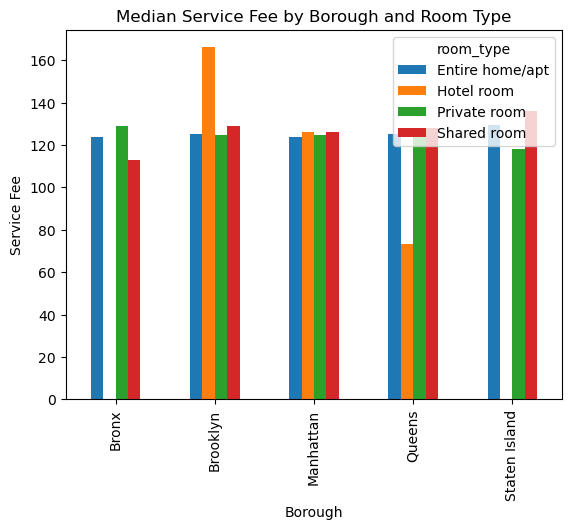

In [47]:
service_df['median'].unstack().plot(kind='bar')
plt.xlabel('Borough')
plt.ylabel('Service Fee')
plt.title('Median Service Fee by Borough and Room Type')
plt.show()

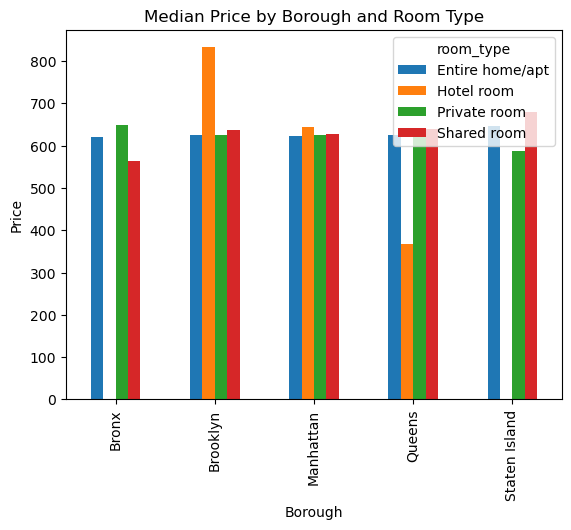

In [48]:
comp_df['median'].unstack().plot(kind='bar')
plt.xlabel('Borough')
plt.ylabel('Price')
plt.title('Median Price by Borough and Room Type')
plt.show()

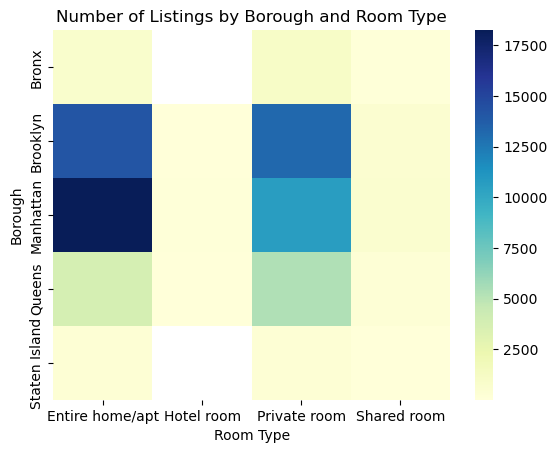

In [49]:
sns.heatmap(comp_df['count'].unstack(), cmap='YlGnBu')
plt.title('Number of Listings by Borough and Room Type')
plt.xlabel('Room Type')
plt.ylabel('Borough')
plt.show()

In [70]:
# Let's look at the neighborhoods with the most expensive listings

# using median for more accurate central tendency and top 10 to get the top 10 most expensive neighborhoods.
neigh_df =  df.groupby('neighborhood')['price'].mean().head(10).sort_values(ascending=False).reset_index()
# index starts from 0

data = [Bar(x = neigh_df['neighborhood'], y = neigh_df['price'], text = neigh_df['neighborhood'])]
layout = Layout(title = "Neighborhoods with Highest Avg Price")

fig = Figure(data = data, layout = layout)

plotly.offline.iplot(fig,show_link = False)


In [51]:
neigh_df

,neighborhood,price
0,Bath Beach,802.00
1,Arden Heights,756.50
2,Arverne,683.50
3,Astoria,637.00
4,Arrochar,624.74
5,Allerton,614.00
6,Bay Ridge,574.00
7,Battery Park City,569.00
8,Bay Terrace,554.50
9,"Bay Terrace, Staten Island",429.50


## Taking a look at seasonality trends and where demand was high

In [52]:

data = [Scatter(x = df['last_review'], y = df['number_of_reviews'], mode = 'markers')]
layout = Layout(title = "Number of Reviews Throughout the Years")
 
fig = Figure(data = data, layout = layout)

plotly.offline.iplot(fig, show_link = False)

## Minimum Nights - How many nights was the most preferred?

<AxesSubplot:xlabel='minimum_nights', ylabel='number_of_reviews'>

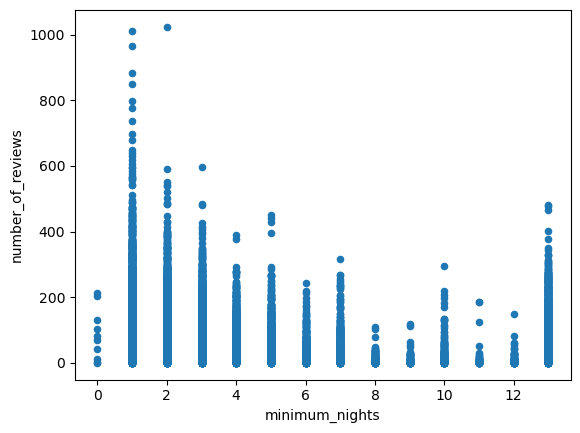

In [53]:
df.plot(x='minimum_nights', y='number_of_reviews', kind='scatter')

In [54]:
min_counts = df['minimum_nights'].value_counts()
min_counts

1     17256
2     15243
13    12924
3     10933
4      4272
5      3973
7      2633
6      1026
10      614
8       160
12      106
9        99
11       40
0        10
Name: minimum_nights, dtype: int64

## Visualization of Count of Minimum Nights Overall

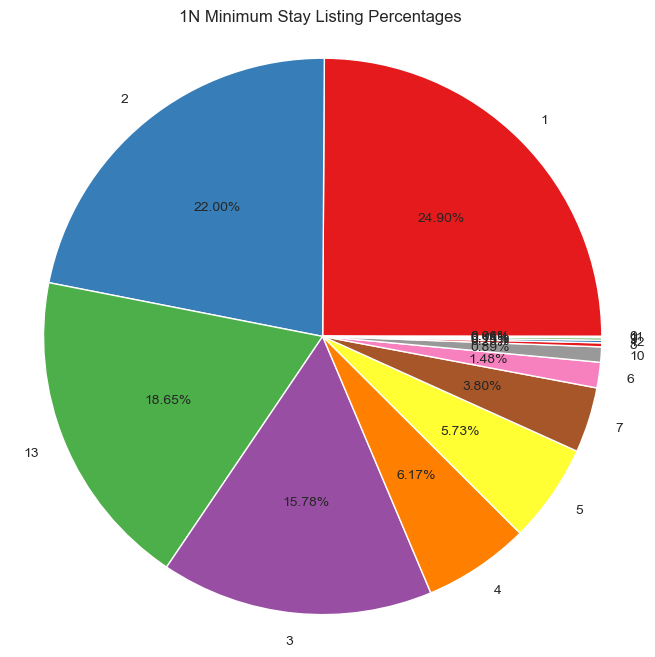

In [55]:


min_counts = df['minimum_nights'].value_counts()

sns.set_style('white')
sns.set_palette('Set1')

fig, ax = plt.subplots(figsize=(8, 8))
ax.pie(min_counts, labels=min_counts.index, autopct='%.2f%%')
ax.set_title('1N Minimum Stay Listing Percentages')
ax.axis('equal')
plt.show()


## Unaffecting Factors on Price

Text(0, 0.5, 'price')

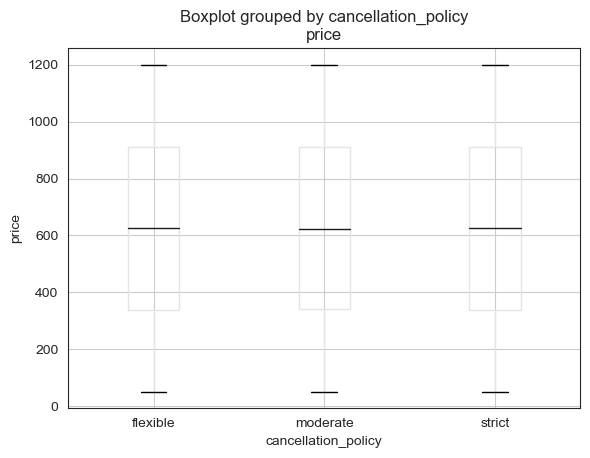

In [64]:
cancel_df = df[['cancellation_policy', 'price']]

cancel_df.boxplot(by = 'cancellation_policy', column = 'price')
plt.ylabel('price')

Text(0, 0.5, 'price')

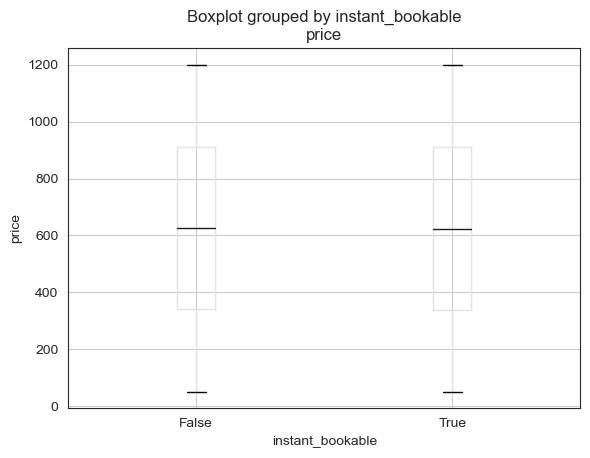

In [60]:
instant_df = df[['instant_bookable', 'price']]

instant_df.boxplot(by = 'instant_bookable', column = 'price')
plt.ylabel('price')

